# Importing Libraries

In [1]:
import os
import re
import string 
import emoji
import json
import numpy as np
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram
from scipy.cluster.hierarchy import linkage
from scipy.spatial.distance import pdist
from wordcloud import WordCloud
from IPython.display import Image

import warnings
warnings.filterwarnings("ignore")

# Importing Data

In [2]:
train_data = pd.read_csv("../input/goemotions/data/train.tsv", sep='\t', header=None, names=['Text', 'Class', 'ID'])
valid_data = pd.read_csv("../input/goemotions/data/dev.tsv", sep='\t', header=None, names=['Text', 'Class', 'ID'])
test_data = pd.read_csv("../input/goemotions/data/test.tsv", sep='\t', header=None, names=['Text', 'Class', 'ID'])

In [3]:
train_data.head()

,Text,Class,ID
0,My favourite food is anything I didn't have to...,27,eebbqej
1,"Now if he does off himself, everyone will thin...",27,ed00q6i
2,WHY THE FUCK IS BAYLESS ISOING,2,eezlygj
3,To make her feel threatened,14,ed7ypvh
4,Dirty Southern Wankers,3,ed0bdzj


In [4]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43410 entries, 0 to 43409
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Text    43410 non-null  object
 1   Class   43410 non-null  object
 2   ID      43410 non-null  object
dtypes: object(3)
memory usage: 1017.5+ KB


# Basic EDA

In [5]:
train_data['Class List'] = train_data['Class'].apply(lambda x: x.split(','))
train_data['Class Length'] = train_data['Class List'].apply(lambda x: len(x))

In [6]:
train_data['Class Length'].max()

5

In [7]:
train_data['Class Length'].value_counts()

1    36308
2     6541
3      532
4       28
5        1
Name: Class Length, dtype: int64

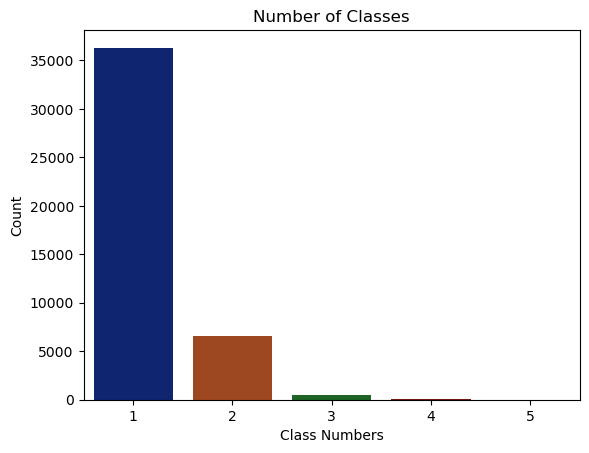

In [8]:
# Checking distribution of the number of labels for each piece of text
temp_df = train_data['Class Length'].value_counts().sort_index()
sns.barplot(x=list(range(1, train_data['Class Length'].max()+1)), y=temp_df, palette=sns.color_palette("dark", 10))
plt.title("Number of Classes")
plt.xlabel("Class Numbers")
plt.ylabel("Count")
plt.show()

In [9]:
emotions_map = {}
with open('../input/goemotions/data/emotions.txt', 'r') as f:
    for i,emotion in enumerate(f):
        emotions_map[str(i)] = emotion.strip()

In [10]:
emotions_map

{'0': 'admiration',
 '1': 'amusement',
 '2': 'anger',
 '3': 'annoyance',
 '4': 'approval',
 '5': 'caring',
 '6': 'confusion',
 '7': 'curiosity',
 '8': 'desire',
 '9': 'disappointment',
 '10': 'disapproval',
 '11': 'disgust',
 '12': 'embarrassment',
 '13': 'excitement',
 '14': 'fear',
 '15': 'gratitude',
 '16': 'grief',
 '17': 'joy',
 '18': 'love',
 '19': 'nervousness',
 '20': 'optimism',
 '21': 'pride',
 '22': 'realization',
 '23': 'relief',
 '24': 'remorse',
 '25': 'sadness',
 '26': 'surprise',
 '27': 'neutral'}

In [11]:
# Mapping the classes into one hot vectors with multi-label
for i in emotions_map:
    train_data[emotions_map[i]] = train_data["Class List"].apply(lambda x: 1 if i in x else 0)

In [12]:
train_data.drop(['Class', 'Class List', 'Class Length'], axis=1, inplace =True)

In [13]:
train_data.head()

,Text,ID,admiration,amusement,anger,annoyance,approval,caring,confusion,curiosity,...,love,nervousness,optimism,pride,realization,relief,remorse,sadness,surprise,neutral
0,My favourite food is anything I didn't have to...,eebbqej,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1,"Now if he does off himself, everyone will thin...",ed00q6i,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2,WHY THE FUCK IS BAYLESS ISOING,eezlygj,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,To make her feel threatened,ed7ypvh,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,Dirty Southern Wankers,ed0bdzj,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


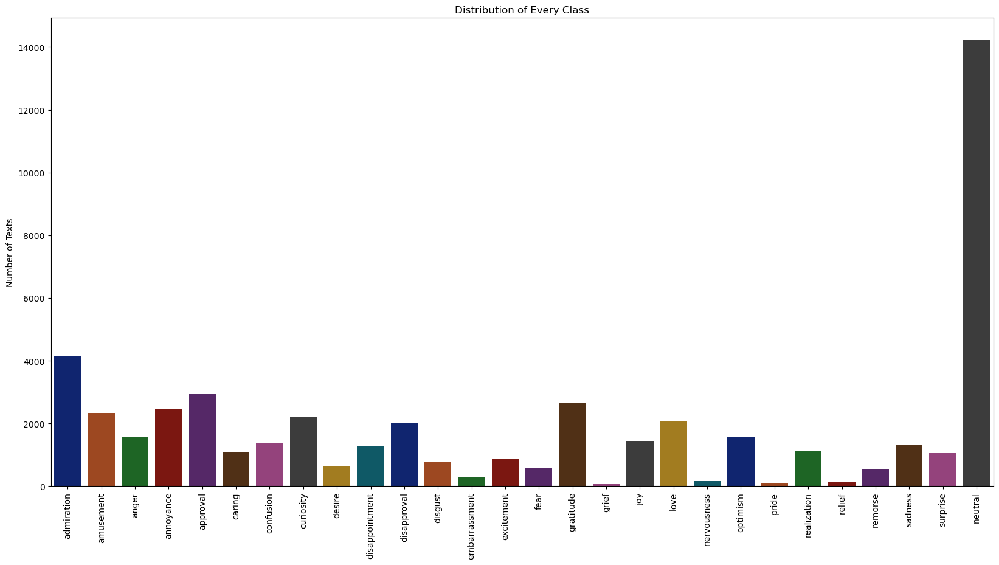

In [14]:
# Checking Distribution of Each Class (Multi-Label included)
emotion_list = list(emotions_map.values())
temp_list = train_data.drop(['Text', "ID"], axis=1).sum(axis=0).tolist()
plt.figure(figsize=(20,10))
sns.barplot(x=emotion_list, y=temp_list, palette=sns.color_palette("dark"))
plt.xticks(rotation="vertical")
plt.title("Distribution of Every Class")
plt.ylabel("Number of Texts")
plt.show()

In [15]:
print("Distribution of number of labels per example:")
print(train_data.drop(['Text', "ID"], axis=1).sum(axis=1).value_counts() / len(train_data))
print("%.2f with more than 3 labels" %
        ((train_data.drop(['Text', "ID"], axis=1).sum(axis=1) > 3).sum() /
         len(train_data)))

Distribution of number of labels per example:
1    0.836397
2    0.150680
3    0.012255
4    0.000645
5    0.000023
dtype: float64
0.00 with more than 3 labels


In [16]:
train_data.columns

Index(['Text', 'ID', 'admiration', 'amusement', 'anger', 'annoyance',
       'approval', 'caring', 'confusion', 'curiosity', 'desire',
       'disappointment', 'disapproval', 'disgust', 'embarrassment',
       'excitement', 'fear', 'gratitude', 'grief', 'joy', 'love',
       'nervousness', 'optimism', 'pride', 'realization', 'relief', 'remorse',
       'sadness', 'surprise', 'neutral'],
      dtype='object')

In [17]:
column = train_data.columns
emotions_with_nuetral = column[2:]
emotions = column[2:-1]

positive_col = ['admiration','amusement','approval','caring','curiosity','excitement','gratitude','joy','love','optimism','relief','surprise']
negative_col = ['sadness','pride','fear','embarrassment','disapproval','disappointment','confusion','annoyance','anger','nervousness','desire']
ambiguous_col = ['remorse','realization','grief','disgust']
neutral_col = ['neutral']

In [18]:
print("Label distributions:")
print((train_data[emotions_with_nuetral].sum(axis=0).sort_values(ascending=False) /
         len(train_data) * 100).round(2))

Label distributions:
neutral           32.76
admiration         9.51
approval           6.77
gratitude          6.13
annoyance          5.69
amusement          5.36
curiosity          5.05
love               4.81
disapproval        4.66
optimism           3.64
anger              3.61
joy                3.34
confusion          3.15
sadness            3.05
disappointment     2.92
realization        2.56
caring             2.50
surprise           2.44
excitement         1.96
disgust            1.83
desire             1.48
fear               1.37
remorse            1.26
embarrassment      0.70
nervousness        0.38
relief             0.35
pride              0.26
grief              0.18
dtype: float64


# EDA from GoEmotions Paper

In [19]:
df_emotion = pd.DataFrame()
df_emotion['emotion'] = list(emotions_with_nuetral)
df_emotion['group'] = 'standalone'
df_emotion['group'].loc[df_emotion['emotion'].isin(positive_col)] = 'positive'
df_emotion['group'].loc[df_emotion['emotion'].isin(negative_col)] = 'negative'
df_emotion['group'].loc[df_emotion['emotion'].isin(ambiguous_col)] = 'ambiguous'
df_emotion.head()

,emotion,group
0,admiration,positive
1,amusement,positive
2,anger,negative
3,annoyance,negative
4,approval,positive


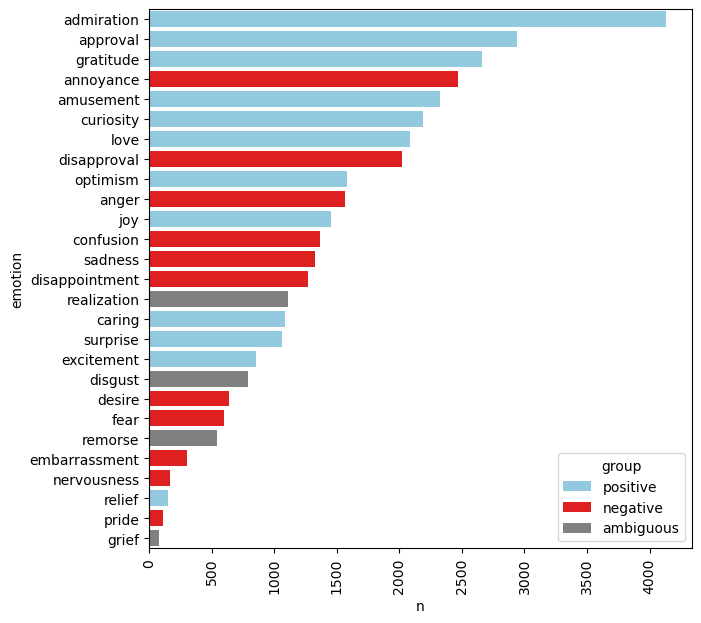

In [20]:
temp = train_data[emotions].sum(axis=0) \
    .reset_index() \
    .rename(columns={'index': 'emotion', 0: 'n'}) \
    .merge(df_emotion, how='left', on='emotion')\
    .sort_values('n', ascending=False)
temp = temp[temp['emotion'] != 'neutral']

fig, ax = plt.subplots(figsize=(7, 7))
ax.tick_params(axis='x', rotation=90)
palette ={
    "positive": "skyblue", 
    "negative": "red", 
    "ambiguous": 'gray'
}
sns.barplot(data=temp, x='n', 
            y='emotion', hue='group', 
            dodge=False,
            palette=palette,
            ax=ax)
plt.show()

<Axes: xlabel='group', ylabel='n'>

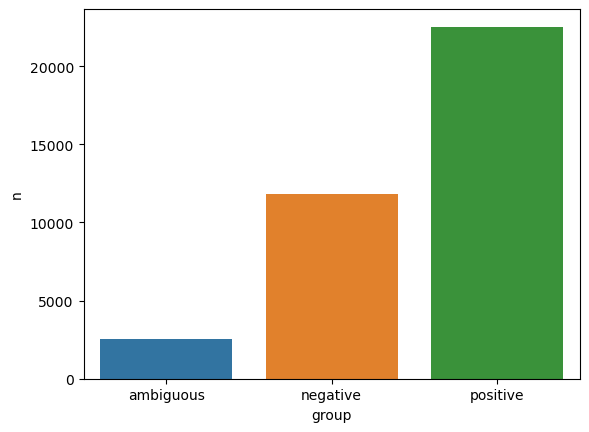

In [21]:
temp = temp.groupby('group') \
        .agg('sum').reset_index()

sns.barplot(data=temp, x='group', y='n')

Plotting label correlations...


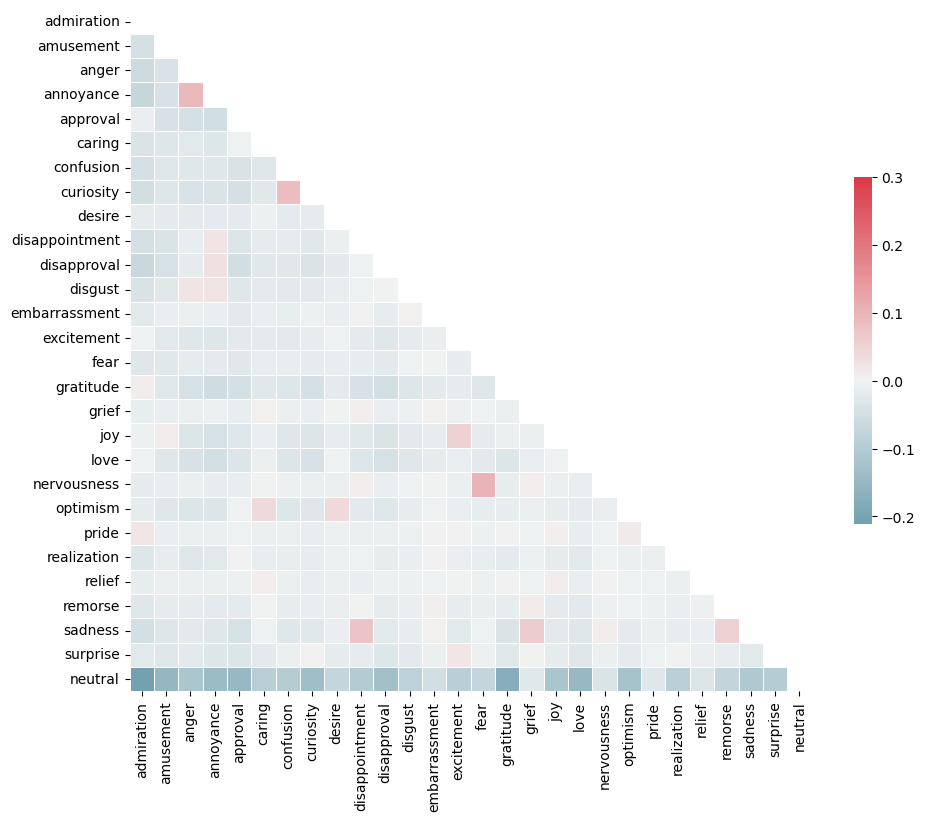

In [22]:
print("Plotting label correlations...")
ratings = train_data.groupby("ID")[emotions_with_nuetral].mean()

corr = ratings.corr()

# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
fig, _ = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(
      corr,
      mask=mask,
      cmap=cmap,
      vmax=.3,
      center=0,
      square=True,
      linewidths=.5,
      cbar_kws={"shrink": .5})
plt.show()

Plotting hierarchical relations...


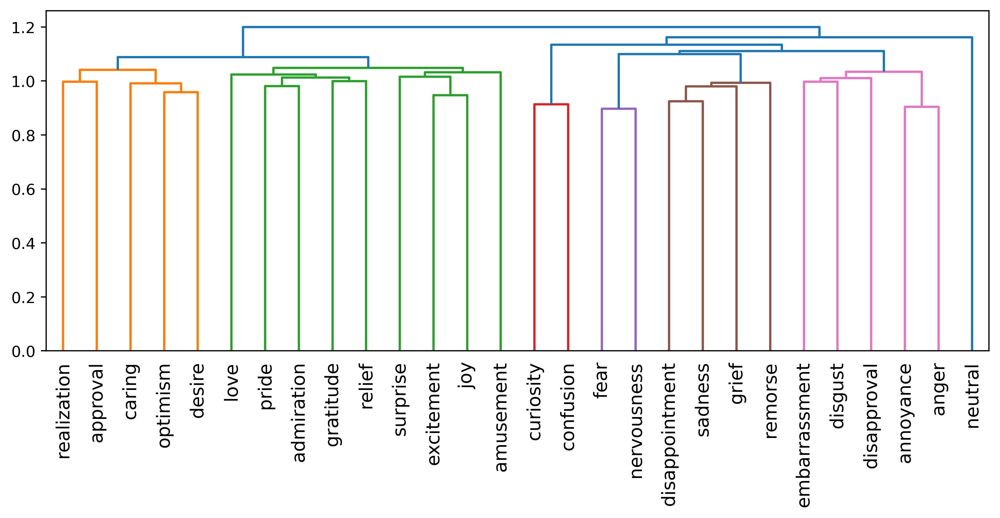

In [23]:
print("Plotting hierarchical relations...")
z = linkage(
      pdist(ratings.T, metric="correlation"),
      method="ward",
      optimal_ordering=True)
fig = plt.figure(figsize=(11, 4), dpi=400)
plt.xlabel("")
plt.ylabel("")
dendrogram(
      z,
      labels=ratings.columns,
      leaf_rotation=90.,  # rotates the x axis labels
      leaf_font_size=12,  # font size for the x axis labels
      color_threshold=1.05,
  )
plt.show()

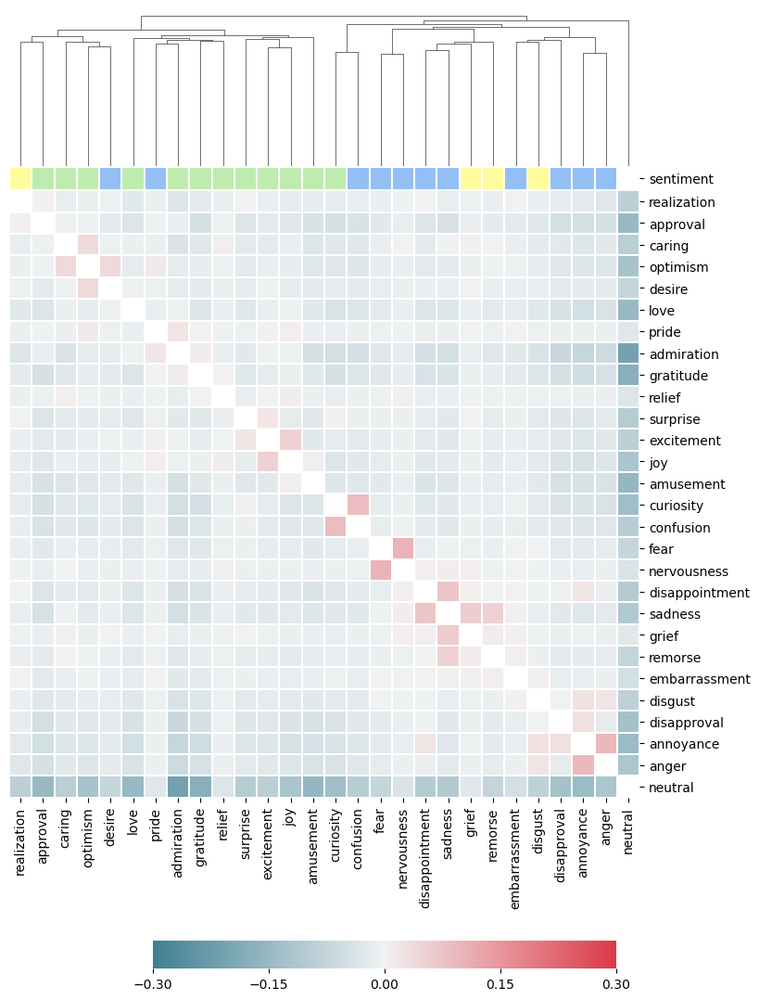

In [24]:
sent_color_map = {
      "positive": "#BEECAF",
      "negative": "#94bff5",
      "ambiguous": "#FFFC9E"
  }

sent_colors = {}
for emotion in emotions:
    if emotion in positive_col:
        sent_colors[emotion] = sent_color_map["positive"]
    elif emotion in negative_col:
        sent_colors[emotion] = sent_color_map["negative"]
    else:
        sent_colors[emotion] = sent_color_map["ambiguous"]
        
mask = np.zeros_like(corr, dtype=bool)
mask[np.diag_indices(mask.shape[0])] = True

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

row_colors = pd.Series(
      corr.columns, index=corr.columns, name="sentiment").map(sent_colors)

# Draw the heatmap with the mask and correct aspect ratio
g = sns.clustermap(
      corr,
      mask=mask,
      cmap=cmap,
      vmax=.3,
      vmin=-0.3,
      center=0,
      row_linkage=z,
      col_linkage=z,
      col_colors=row_colors,
      linewidths=.1,
      cbar_kws={
          "ticks": [-.3, -.15, 0, .15, .3],
          "use_gridspec": False,
          "orientation": "horizontal",
      },
      figsize=(10, 10))

g.ax_row_dendrogram.set_visible(False)
g.cax.set_position([.34, -0.05, .5, .03])

# WordCloud with Ekman Taxonomy

In [25]:
emotions_data = pd.read_csv("../input/goemotions/tables/emotion_words.csv")

In [26]:
emotions_data.head()

,emotion,word,odds,freq
0,admiration,great,41.80,0.014
1,admiration,awesome,31.18,0.007
2,admiration,amazing,29.65,0.006
3,admiration,good,26.87,0.016
4,admiration,beautiful,22.87,0.004


In [27]:
emotions_data["emotion"].value_counts()

neutral           174
admiration        138
approval           92
annoyance          82
gratitude          74
amusement          55
anger              53
disapproval        51
curiosity          45
sadness            40
love               39
caring             37
surprise           34
joy                34
confusion          33
optimism           33
excitement         26
fear               24
disgust            23
realization        22
disappointment     22
embarrassment      13
desire             10
remorse             9
nervousness         6
relief              4
pride               3
grief               2
Name: emotion, dtype: int64

In [28]:
with open('../input/goemotions/data/ekman_mapping.json') as file:
    ekman_mapping = json.load(file)

In [29]:
ekman_mapping

{'anger': ['anger', 'annoyance', 'disapproval'],
 'disgust': ['disgust'],
 'fear': ['fear', 'nervousness'],
 'joy': ['joy',
  'amusement',
  'approval',
  'excitement',
  'gratitude',
  'love',
  'optimism',
  'relief',
  'pride',
  'admiration',
  'desire',
  'caring'],
 'sadness': ['sadness', 'disappointment', 'embarrassment', 'grief', 'remorse'],
 'surprise': ['surprise', 'realization', 'confusion', 'curiosity']}

In [30]:
for i in range(len(emotions_data)):
    if emotions_data.iloc[i,0] in ekman_mapping["anger"]:
        emotions_data.iloc[i,0] = "anger"
    elif emotions_data.iloc[i,0] in ekman_mapping["disgust"]:
        emotions_data.iloc[i,0] = "disgust"
    elif emotions_data.iloc[i,0] in ekman_mapping["fear"]:
        emotions_data.iloc[i,0] = "fear"
    elif emotions_data.iloc[i,0] in ekman_mapping["joy"]:
        emotions_data.iloc[i,0] = "joy"
    elif emotions_data.iloc[i,0] in ekman_mapping["sadness"]:
        emotions_data.iloc[i,0] = "sadness"
    elif emotions_data.iloc[i,0] in ekman_mapping["surprise"]:
        emotions_data.iloc[i,0] = "surprise"
    else:
        emotions_data.iloc[i,0] = "neutral"

In [31]:
emotions_data.head()

,emotion,word,odds,freq
0,joy,great,41.80,0.014
1,joy,awesome,31.18,0.007
2,joy,amazing,29.65,0.006
3,joy,good,26.87,0.016
4,joy,beautiful,22.87,0.004


In [32]:
emotions_data["emotion"].value_counts()

joy         545
anger       186
neutral     174
surprise    134
sadness      86
fear         30
disgust      23
Name: emotion, dtype: int64

In [33]:
wc_dict = {}
for i in emotions_data['emotion'].unique():
    wc_dict[i] = {}
    odds_list = emotions_data[emotions_data['emotion'] == i]['odds'].tolist()
    word_list = emotions_data[emotions_data['emotion'] == i]['word'].tolist()
    wc_dict[i] = dict(dict(zip(word_list,odds_list)))

In [34]:
wc_dict.keys()

dict_keys(['joy', 'anger', 'surprise', 'sadness', 'disgust', 'fear', 'neutral'])

In [35]:
def plot_cloud(wordcloud):
    plt.figure(figsize=(30, 20))
    plt.imshow(wordcloud) 
    plt.axis("off");

In [36]:
wordcloud = WordCloud(width = 1000, height = 500, random_state=42, background_color='black', colormap='Set2', collocations=False)

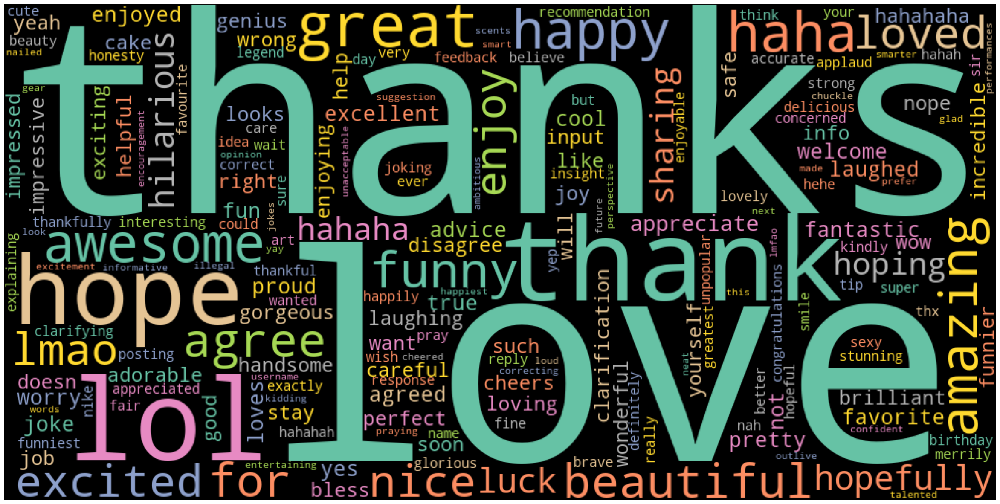

In [37]:
# Plotting WordCloud for Class ['joy', 'anger', 'surprise', 'sadness', 'disgust', 'fear', 'neutral'] respectively
plot_cloud(wordcloud.generate_from_frequencies(wc_dict['joy']))

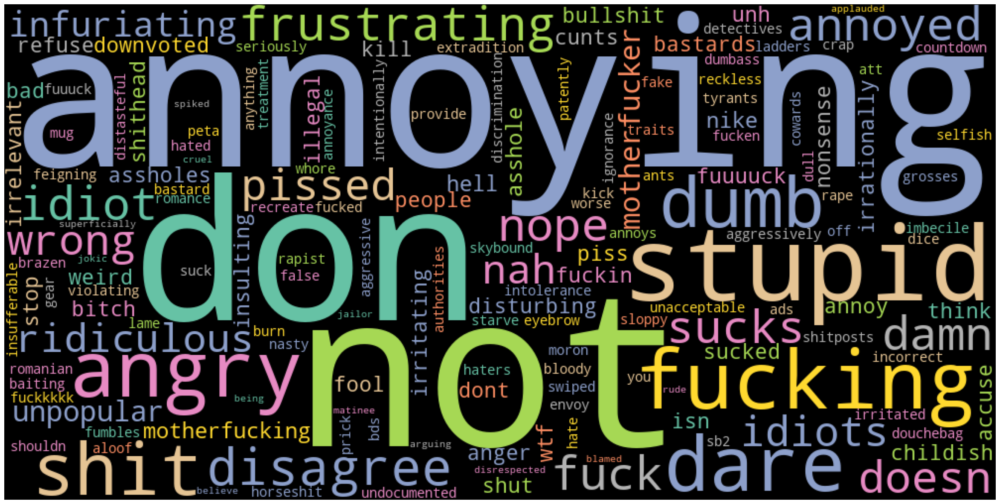

In [38]:
plot_cloud(wordcloud.generate_from_frequencies(wc_dict['anger']))

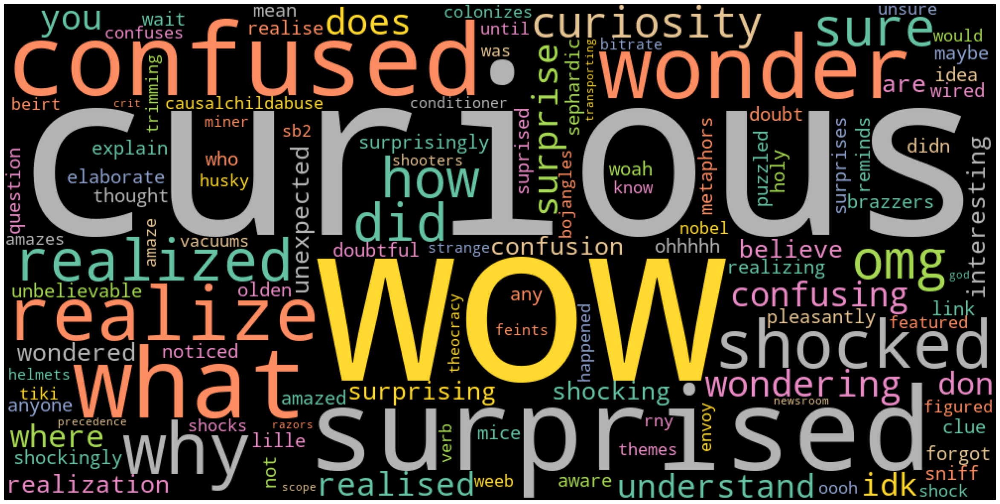

In [39]:
plot_cloud(wordcloud.generate_from_frequencies(wc_dict['surprise']))

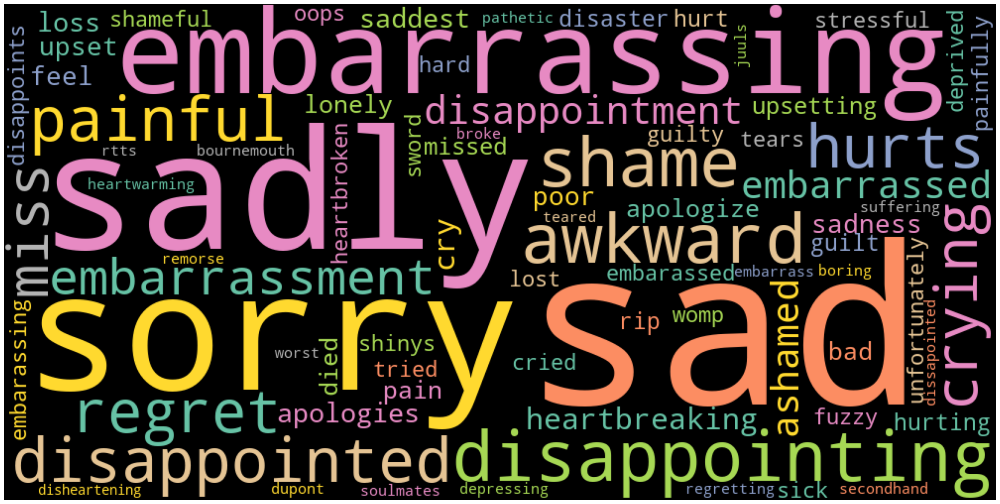

In [40]:
plot_cloud(wordcloud.generate_from_frequencies(wc_dict['sadness']))

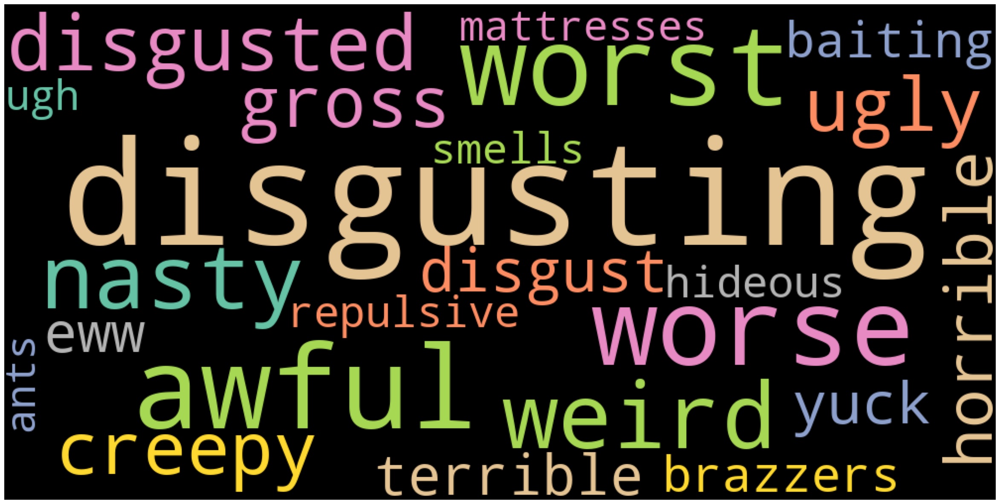

In [41]:
plot_cloud(wordcloud.generate_from_frequencies(wc_dict['disgust']))

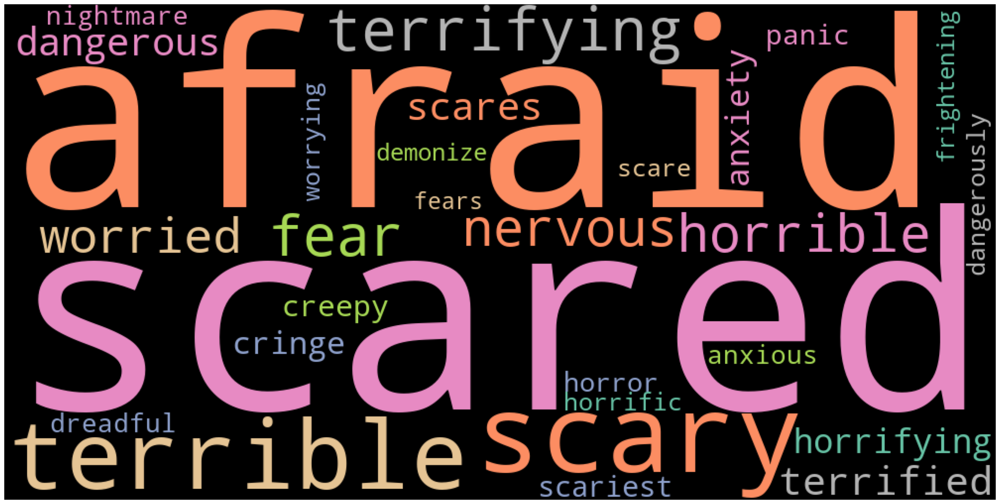

In [42]:
plot_cloud(wordcloud.generate_from_frequencies(wc_dict['fear']))

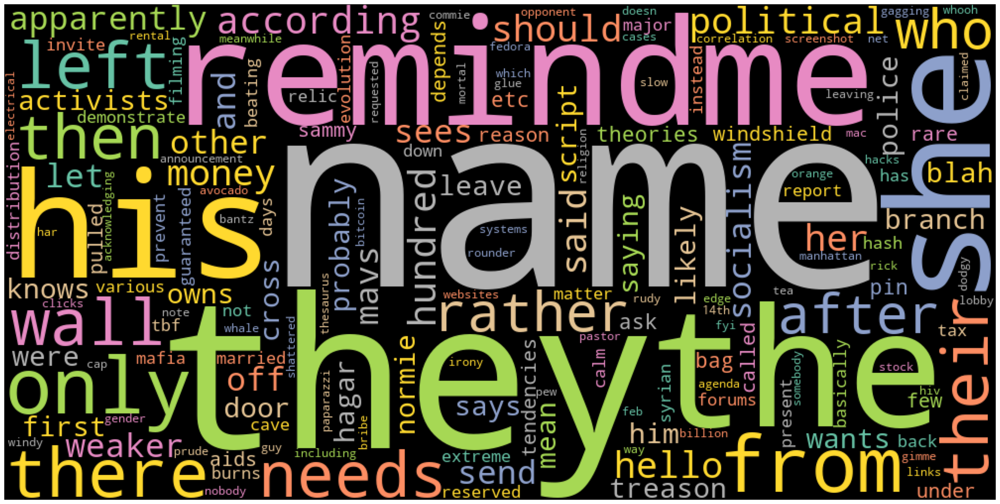

In [43]:
plot_cloud(wordcloud.generate_from_frequencies(wc_dict['neutral']))